# Data analysis for the Boeker study replication 

### 1. Loading and processing scrapped data

In [20]:
import os
import json
import unicodedata
import re
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from wordcloud import WordCloud

base_dir = os.getcwd()
relative_path = '../data/'
files_path = os.path.join(base_dir, relative_path)

In [21]:
all_user_ids = ['9', '15-1', '15-2', '15-4', '15-5', '16', '18', '22', '23', '24', '28', '29', '33', '34', '35', '37', '38', '39', '40', '41', '42']
location_user_ids = ['15-1', '15-2', '15-4', '15-5']
random_explicit_activity_user_ids = ['16', '28', '29']
defined_explicit_activity_user_ids = ['18', '22', '23', '24']
random_implicit_activity_user_ids = ['33', '34', '35', '37']
defined_implicit_activity_user_ids = ['38', '39', '40', '41', '42']

In [22]:
hashtags_to_ignore = [" ", "foryoupage", "fyp", "foryou", "fyr", "'fyp'", "tiktok", "capcut", "CapCut", "viral", "video", "trend", "' '", "''", "['']", "funny", "edit", "trendy", "trending", "trend"]

In [23]:
mapping_dict_activity = {
    '16': 'Likes random hashtags',
    '18': 'Likes predefined content',
    '22': 'Likes predefined content',
    '23': 'Likes predefined content',
    '24': 'Likes predefined content',
    '28': 'Follow content creators',
    '29': 'Follow content creators',
    '33': 'Watch longer random hashtags',
    '34': 'Watch longer random hashtags',
    '35': 'Watch longer random hashtags',
    '37': 'Watch longer random hashtags',
    '39': 'Watch longer predefined hashtags',
    '40': 'Watch longer predefined hashtags',
    '41': 'Watch longer predefined hashtags',
    '42': 'Watch longer predefined hashtags',
}

In [24]:
mapping_dict_location = {
    '15-1-control': 'US_1',
    '15-2-control': 'US_2',
    '15-4-control': 'US_3',
    '15-5-control': 'US_4',
    '15-1-experiment': 'Germany',
    '15-2-experiment': 'France',
    '15-4-experiment': 'Romania',
    '15-5-experiment': 'Ukraine'
}

In [25]:
def clean_text(text):
    """Ensure text is UTF-8 encoded and strip out non-ASCII characters."""
    # Normalize text to remove accents and unusual unicode characters
    normalized_text = unicodedata.normalize('NFKD', text)
    # Encode to ASCII, ignoring characters that cannot be encoded, then decode back to string
    return normalized_text.encode('ascii', 'ignore').decode('ascii')

def parse_info(video, user_id):
    d = {}
    d["user_id"] = user_id
    d["user_number"] = user_id[:user_id.rfind('-')]
    d["user_type"] = 'control' if 'control' in user_id else 'personalized'
    
    author = video.get("author", {})
    stats = video.get("stats", {})
    music = video.get("music", {})
    video_stats = video.get("video", {})
    text_extras = video.get("contents", [{}])[0].get("textExtra", [])

    # Basic video details
    d["play_count"] = stats.get("playCount", 0)
    d["digg_count"] = stats.get("diggCount", 0)
    d["share_count"] = stats.get("shareCount", 0)
    d["comment_count"] = stats.get("commentCount", 0)
    d["collect_count"] = stats.get("collectCount", 0)
    d["repost_count"] = video.get("statsV2", {}).get("repostCount", 0)
    d["loudness"] = video_stats.get("volumeInfo", {}).get("Loudness", "N/A")
    d["duration"] = video_stats.get("duration", "N/A")  # Video duration

    # Author details
    d["author_id"] = author.get("id", "Unknown Author")
    d["author_name"] = clean_text(author.get("nickname", "Unknown Author Name"))
    d["author_bio"] = clean_text(author.get("signature", "No bio"))  # Cleaned Author bio

    # Music details
    d["music_name"] = clean_text(music.get("title", "Unknown Music Title"))
    d["music_id"] = music.get("id", "Unknown Music ID")
    d["music_author"] = clean_text(music.get("authorName", "Unknown Music Author"))
    d["music_album"] = clean_text(music.get("album", "Unknown Album"))  # Cleaned Music album

    # Hashtags from textExtra
    hashtags = [clean_text(extra.get("hashtagName")) for extra in text_extras if extra.get("type") == 1]
    d["hashtags"] = '_'.join(hashtags)

    d["video_id"] = video.get("id", "Unknown ID")

    df = pd.DataFrame([d])
    df["repost_count"] = df["repost_count"].astype(int)
    return df

In [26]:
def load_data_into_df(user_ids: list) -> pd.DataFrame:
    df_jsons = []
    run_batches = []
    for user_id in user_ids:
        for user_type in ['control', 'experiment']:
            user_path = files_path + f'{user_id}/{user_id}-{user_type}/'

            for root, dirs, files in os.walk(user_path):
                if 'responses' in dirs:
                    user_path = os.path.join(root, 'responses')              
                for file in files:
                    if file.endswith('.json') and file != 'config.json':
                        file_path = os.path.join(root, file)
                        with open(file_path, 'r') as f:
                            data = json.load(f)
                            if 'itemList' not in data:
                                pass
                            else:
                                for video in data['itemList']:
                                    df_jsons.append(parse_info(video, str(user_id) + '-' + user_type))
                                    run_batches.append(user_path.split('\\')[-2].split('/')[-1])

    data_combined = pd.concat(df_jsons, ignore_index=True)
    data_combined['run_number'] = data_combined.groupby('user_id').cumcount() + 1
    data_combined['run_batch'] = run_batches

    return data_combined

### 2. Data exploration

In [27]:
def analyze_data(data: pd.DataFrame):
    get_basic_info(data)
    show_missing_values(data)
    show_unique_values(data)
    plot_histograms(data)
    plot_boxplots(data)

def get_basic_info(data: pd.DataFrame):
    print(f"Shape: {data.shape}")
    print("Data types:")
    print(data.dtypes)
    print(data.describe())

def show_missing_values(data: pd.DataFrame):
    if data.isnull().sum().sum() > 0:
        plt.figure(figsize=(10, 6))
        data.isnull().sum().plot(kind='bar')
        plt.title(f'Number of Missing Data per Column')
        plt.xlabel('Columns')
        plt.ylabel('Number of Missing Values')
        plt.show()
    else:
        print("No missing values found.")

def show_unique_values(data: pd.DataFrame):
    plt.figure(figsize=(10, 6))
    data.nunique().plot(kind='bar')
    plt.title(f'Number of Unique Values per Column')
    plt.xlabel('Columns')
    plt.ylabel('Number of Unique Values')
    plt.show()

def plot_histograms(data: pd.DataFrame):
    user_ids = data['user_id'].unique()
    numerical_cols = data.select_dtypes(include=['float64', 'int64']).columns
    
    for col in numerical_cols:
        fig, axes = plt.subplots(1, len(user_ids), figsize=(15, 6), sharey=True)
        fig.suptitle(f'Histogram of {col} by User ID', fontsize=16)
        
        for ax, user_id in zip(axes, user_ids):
            user_data = data[data['user_id'] == user_id]
            user_data[col].hist(bins=50, ax=ax, alpha=0.7)
            ax.set_title(f'User ID {user_id}')
            ax.set_xlabel(col)
            ax.set_ylabel('Frequency')
        
        plt.tight_layout(rect=[0, 0, 1, 0.96])
        plt.show()  

def plot_boxplots(data: pd.DataFrame):
    user_ids = data['user_id'].unique()
    numerical_cols = data.select_dtypes(include=['float64', 'int64']).columns

    for col in numerical_cols:
        fig, axes = plt.subplots(1, len(user_ids), figsize=(15, 6), sharey=True)
        fig.suptitle(f'Boxplot of {col} by User ID', fontsize=16)
        
        for ax, user_id in zip(axes, user_ids):
            user_data = data[data['user_id'] == user_id]
            user_data.boxplot(column=col, ax=ax)
            ax.set_title(f'User ID {user_id}')
            ax.set_xlabel(col)
        
        plt.tight_layout()
        plt.show()               

In [28]:
data_combined = load_data_into_df(all_user_ids)
# analyze_data(data_combined)
data_combined["hashtags_list"] = data_combined["hashtags"].str.split('_')
data_combined["hashtags_list"] = data_combined["hashtags_list"].apply(lambda x: [hashtag for hashtag in x if not any(ignore in hashtag for ignore in hashtags_to_ignore)])
data_combined["hashtags_list"] = data_combined["hashtags_list"].apply(lambda x: [re.sub(r'[^a-zA-Z0-9\s]', '', item.lower()) for item in x])
data_combined

IndexError: list index out of range

In [10]:
# Explode the hashtags_list column to transform each list into separate rows
exploded_hashtags = data_combined['hashtags_list'].explode()
filtered_hashtags = pd.Series([hashtag for hashtag in exploded_hashtags if hashtag not in hashtags_to_ignore])

print(filtered_hashtags.value_counts())

                14062
copylinkpls      2427
storytime        2426
roblox           2001
pov              1540
                ...  
aromatizador        1
site                1
shop                1
scented             1
alexabliss          1
Name: count, Length: 18388, dtype: int64


In [11]:
def jaccard_similarity(list1: list, list2: list):
    set1 = set(list1)
    set2 = set(list2)
    intersection = len(set1.intersection(set2))
    union = len(set1.union(set2))
    return intersection / union

In [12]:
def helper_match(list1: list, list2: list, exact_match: bool = True):
    for item1 in list1:
        for item2 in list2:
            if exact_match:
                if item1 == item2: 
                    return 1
                else:
                    pass
            else:
                if ((item1 in item2) or (item2 in item1)):
                    return 1
                else:
                    pass
    return 0

In [13]:
def basic_match_similarity(list_of_lists1: list, list_of_lists2: list):
    similarity = 0
    denominator = 0
    
    for list1 in list_of_lists1:
        for list2 in list_of_lists2:
            if ((len(list1) > 0) and (len(list2) > 0)):
                similarity += helper_match(list1, list2)
                denominator += 1
            else:
                pass
            
    return similarity / denominator

In [14]:
def basic_match_similarity_batched(list_of_lists1: list, list_of_lists2: list):
    similarity = 0

    flatten_list2 = [item for sublist in list_of_lists2 for item in sublist]
    for list1 in list_of_lists1:
            similarity += helper_match(list1, flatten_list2)
            
    return similarity / len(list_of_lists1)

In [15]:
def similarity_matrix(data: pd.DataFrame, col: str, similarity_type: str):
    ids = data.user_id.unique()
    matrix = pd.DataFrame(index=ids, columns=ids)

    for x in ids:
        for y in ids:
            if similarity_type == 'Basic_Match':
                if x == y:
                    matrix.loc[x,y] = 1
                else:
                    matrix.loc[x, y] = basic_match_similarity_batched(data[data.user_id == x][col].tolist(), data[data.user_id == y][col].tolist())
            elif similarity_type == 'Jaccard': 
                if type(data[data.user_id == x][col].values[0]) == list:
                    x_list = [item for sublist in data[data.user_id == x][col].tolist() for item in sublist] 
                    y_list = [item for sublist in data[data.user_id == y][col].tolist() for item in sublist]
                else:
                    x_list = data[data.user_id == x][col].tolist()
                    y_list = data[data.user_id == y][col].tolist()
                matrix.loc[x, y] = jaccard_similarity(x_list, y_list)
            else:
                print("Unknown similarity type provided.")

    matrix = matrix.astype(float)

    # Visualize the similarity matrix as a heatmap
    plt.figure(figsize=(8, 6))
    sns.heatmap(matrix, annot=True, cmap='coolwarm', vmin=0, vmax=1)
    plt.title(f'{similarity_type} Similarity Matrix for {col}')
    plt.show()

In [16]:
def calculate_number_of_buckets(data: pd.DataFrame, bucket_size: int) -> int:
    return int(len(data)//bucket_size)

In [17]:
def smilarity_between_buckets(data: pd.DataFrame, bucket_size: int) -> pd.DataFrame:
    d_all = {}
    for user_id in data["user_id"].unique():
        chosen_data = data[data['user_id'] == user_id]

        nr_buckets = calculate_number_of_buckets(chosen_data, bucket_size)
        d_all[user_id] = {}
        for i in range(nr_buckets - 2):
            d_all[user_id][f"{i + 1} - {i + 2}"] = basic_match_similarity(chosen_data[i:i + bucket_size]['hashtags_list'], chosen_data[i + bucket_size:i + 2*bucket_size]['hashtags_list'])

    return pd.DataFrame(d_all).T

In [18]:
def smilarity_between_head_and_tail(data: pd.DataFrame, col:str, bucket_size: int) -> pd.DataFrame:
    d = {}
    for user_id in data["user_id"].unique():
        bucket_chosen_data = data[data['user_id'] == user_id]
        bucket_chosen_data = bucket_chosen_data.sort_values(by=['run_batch', 'run_number'])
        first_bucket_chosen_data = bucket_chosen_data.head(bucket_size)
        last_bucket_chosen_data = bucket_chosen_data.tail(bucket_size)

        d[user_id] = basic_match_similarity(first_bucket_chosen_data[col].tolist(), last_bucket_chosen_data[col].tolist())

    similarity_fl_bucket_data = pd.DataFrame(list(d.items()), columns=['user_id', 'similarity'])

    similarity_fl_bucket_data = similarity_fl_bucket_data.sort_values(by='similarity', ascending=False)
    similarity_fl_bucket_data = similarity_fl_bucket_data.reset_index(drop=True)

    return similarity_fl_bucket_data

In [19]:
def similarity_between_P_and_C(data: pd.DataFrame, bucket_size: int) -> pd.DataFrame:
    for user_id in data["user_number"].unique():
        chosen_data = data[data['user_number'] == user_id]
        chosen_data = chosen_data[chosen_data['run_number'] <= min(chosen_data.user_id.value_counts().values.tolist())]

        chosen_data_control = chosen_data[chosen_data['user_type'] == 'control']
        chosen_data_personalized = chosen_data[chosen_data['user_type'] == 'personalized']

        d = {}
        for i in range(calculate_number_of_buckets(chosen_data_control, bucket_size) - 1):
            d[i + 1] = basic_match_similarity(chosen_data_control[i:i + bucket_size]['hashtags_list'], chosen_data_personalized[i:i + bucket_size]['hashtags_list'])
            
    return pd.DataFrame(d, index=["P_vs_C_similarity"]).T

### 3. Controlling against noise

In [20]:
bucket_size = 125

In [21]:
control_data = data_combined[data_combined['user_type'] == 'control']
control_data.user_id.value_counts()

user_id
16-control      1772
41-control      1243
15-2-control    1152
24-control      1085
15-1-control    1072
9-control       1066
34-control      1063
39-control      1063
38-control      1062
23-control      1059
22-control      1058
33-control      1053
28-control      1051
18-control      1050
37-control      1049
15-5-control    1030
15-4-control     922
42-control       912
35-control       801
29-control       739
40-control       661
Name: count, dtype: int64

In [22]:
control_similarities = []

for x in control_data.user_id.unique():
    for y in control_data.user_id.unique():
        if x != y:
            control_similarities.append(jaccard_similarity(control_data[control_data.user_id == x]['video_id'].tolist(), control_data[control_data.user_id == y]['video_id'].tolist()))
print("Similarity between control runs:")
print(control_similarities)
print("Mean similarity between control runs:")
print(float(np.mean(control_similarities)))
print("Median similarity between control runs:")
print(float(np.median(control_similarities)))
print("Minimal similarity between control runs:")
print(float(np.min(control_similarities)))
print("Maximal similarity between control runs:")
print(float(np.max(control_similarities)))

Similarity between control runs:
[0.08894736842105264, 0.08503054989816701, 0.05521811154058531, 0.04502617801047121, 0.05434782608695652, 0.07094418362023996, 0.06912681912681913, 0.060353798126951096, 0.06732776617954071, 0.03993933265925177, 0.09968652037617555, 0.05295629820051414, 0.06528497409326425, 0.04192992533026996, 0.06275933609958506, 0.06573498964803312, 0.05885389778007228, 0.033971587399629403, 0.07032755298651253, 0.03278688524590164, 0.08894736842105264, 0.14946236559139786, 0.11706464764123471, 0.1426126640045636, 0.12094240837696335, 0.15083798882681565, 0.16610169491525423, 0.1392757660167131, 0.15410573678290213, 0.11206896551724138, 0.12022900763358779, 0.06531881804043546, 0.054703476482617586, 0.050173010380622836, 0.17485714285714285, 0.06880496637351267, 0.1600901916572717, 0.1154611811546118, 0.13840653728294178, 0.1258160237388724, 0.08503054989816701, 0.14946236559139786, 0.17298578199052134, 0.20619158878504673, 0.15643044619422572, 0.20842824601366744, 0

In [23]:
control_run_data = data_combined[data_combined['user_number'] == '9']
control_run_data.user_id.value_counts()

user_id
9-experiment    1118
9-control       1066
Name: count, dtype: int64

In [24]:
print("Similarity between control and personalized run for control scenario 9 in terms of video id:")
print(jaccard_similarity(control_run_data[control_run_data.user_type == "control"]['video_id'].tolist(), control_run_data[control_run_data.user_type == "personalized"]['video_id'].tolist()))

Similarity between control and personalized run for control scenario 9 in terms of video id:
0.0467436974789916


In [25]:
smilarity_between_buckets(control_run_data, bucket_size)

,1 - 2,2 - 3,3 - 4,4 - 5,5 - 6,6 - 7
9-control,0.185014,0.185014,0.183056,0.183194,0.186736,0.183333
9-experiment,0.102721,0.102721,0.105919,0.104853,0.102968,0.103542


In [26]:
for user_id in control_run_data.user_id.unique():
    print(f"Average similarity between buckets for user {user_id} in termsn of hashtags:")
    print(smilarity_between_buckets(control_run_data, bucket_size).T[user_id].mean())

Average similarity between buckets for user 9-control in termsn of hashtags:
0.18439124260815434
Average similarity between buckets for user 9-experiment in termsn of hashtags:
0.10378726431771541


In [27]:
similarity_between_P_and_C(control_run_data, bucket_size)

,P_vs_C_similarity
1,0.160631
2,0.160556
3,0.160819
4,0.161769
5,0.158114
6,0.155117
7,0.152641


In [28]:
print("Average similarity between control and personalized in terms of hashtags:")
print(similarity_between_P_and_C(control_run_data, bucket_size).mean())

Average similarity between control and personalized in terms of hashtags:
P_vs_C_similarity    0.158521
dtype: float64


### 4. Location analysis

In [29]:
location_data = data_combined[data_combined['user_number'].isin(location_user_ids)]
location_data.user_id.value_counts()

user_id
15-4-experiment    1196
15-2-experiment    1187
15-2-control       1152
15-1-control       1072
15-5-experiment    1066
15-5-control       1030
15-4-control        922
15-1-experiment     640
Name: count, dtype: int64

In [30]:
location_data["user_name"] = location_data["user_id"].map(mapping_dict_location)
location_data.drop(columns=["user_id"], inplace=True)
location_data.rename(columns={"user_name": "user_id"}, inplace=True)
location_data.user_id.value_counts()


C:\Users\KINIT0033\AppData\Local\Temp\ipykernel_21696\3423255911.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  location_data["user_name"] = location_data["user_id"].map(mapping_dict_location)
C:\Users\KINIT0033\AppData\Local\Temp\ipykernel_21696\3423255911.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  location_data.drop(columns=["user_id"], inplace=True)
C:\Users\KINIT0033\AppData\Local\Temp\ipykernel_21696\3423255911.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation:

user_id
Romania    1196
France     1187
US_2       1152
US_1       1072
Ukraine    1066
US_4       1030
US_3        922
Germany     640
Name: count, dtype: int64

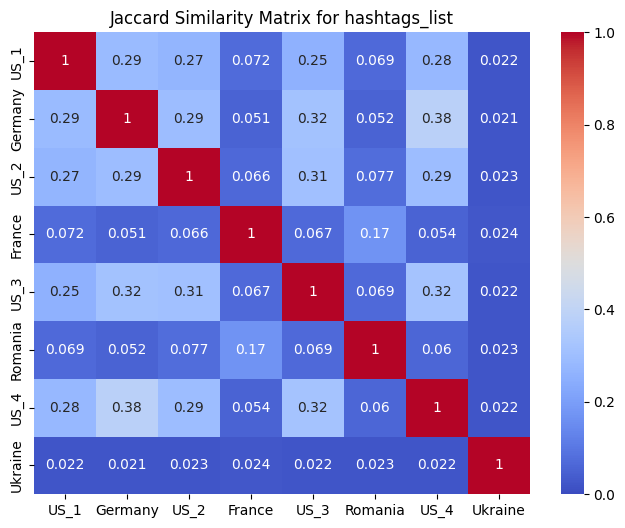

In [31]:
similarity_matrix(location_data, 'hashtags_list', 'Jaccard')

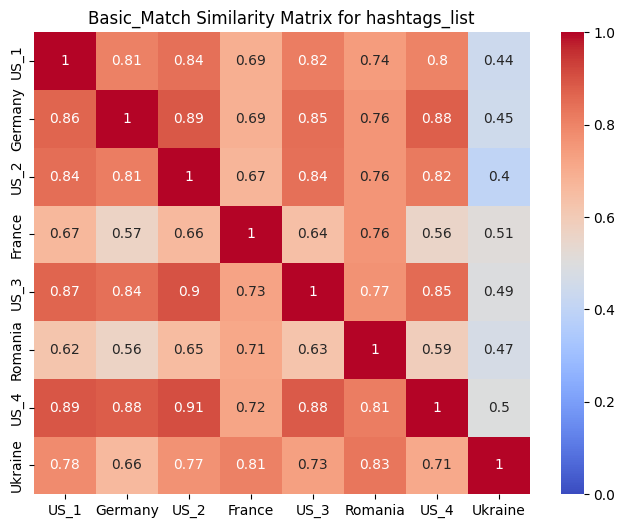

In [32]:
similarity_matrix(location_data, 'hashtags_list', 'Basic_Match')

### 5. Activity analysis

In [33]:
activity_data = data_combined[data_combined['user_number'].isin(defined_explicit_activity_user_ids + random_explicit_activity_user_ids + defined_implicit_activity_user_ids + random_implicit_activity_user_ids)]
activity_data.user_id.value_counts()

user_id
16-control       1772
18-experiment    1594
16-experiment    1275
41-control       1243
41-experiment    1166
37-experiment    1123
35-experiment    1091
24-control       1085
24-experiment    1083
34-experiment    1074
42-experiment    1070
23-experiment    1067
40-experiment    1065
34-control       1063
39-control       1063
38-control       1062
23-control       1059
22-control       1058
33-experiment    1054
33-control       1053
29-experiment    1052
28-control       1051
18-control       1050
37-control       1049
38-experiment    1040
28-experiment     994
42-control        912
22-experiment     810
35-control        801
39-experiment     794
29-control        739
40-control        661
Name: count, dtype: int64

In [34]:
smilarity_between_buckets(activity_data, bucket_size)

,1 - 2,2 - 3,3 - 4,4 - 5,5 - 6,6 - 7,7 - 8,8 - 9,9 - 10,10 - 11,11 - 12,12 - 13
16-control,0.073696,0.072943,0.073087,0.074021,0.072152,0.071721,0.072080,0.071003,0.070428,0.069350,0.069278,0.069493
16-experiment,0.194948,0.194922,0.194655,0.191457,0.191657,0.195322,0.194922,0.194922,NaN,NaN,NaN,NaN
18-control,0.111407,0.113593,0.114549,0.117691,0.114686,0.111544,NaN,NaN,NaN,NaN,NaN,NaN
18-experiment,0.077579,0.080379,0.082711,0.083244,0.083111,0.082628,0.082364,0.080315,0.078332,0.079302,NaN,NaN
22-control,0.105951,0.106229,0.106438,0.106299,0.106229,0.106368,NaN,NaN,NaN,NaN,NaN,NaN
22-experiment,0.084450,0.084659,0.084381,0.084034,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
23-control,0.088025,0.088866,0.089426,0.089846,0.089846,0.089236,NaN,NaN,NaN,NaN,NaN,NaN
23-experiment,0.090301,0.089536,0.089241,0.089904,0.093294,0.093220,NaN,NaN,NaN,NaN,NaN,NaN
24-control,0.088355,0.090982,0.089143,0.088055,0.086294,0.088201,NaN,NaN,NaN,NaN,NaN,NaN
24-experiment,0.095588,0.093137,0.090476,0.091036,0.090196,0.091590,NaN,NaN,NaN,NaN,NaN,NaN


In [35]:
CP_activity_data = smilarity_between_buckets(activity_data, bucket_size)
user_numbers = [el.split('-')[0] for el in CP_activity_data.index]
user_types = [el.split('-')[1] for el in CP_activity_data.index]
CP_activity_data["user_number"] = user_numbers
CP_activity_data["user_type"] = user_types

CP_activity_data["group"] = CP_activity_data["user_number"].map(mapping_dict_activity)
CP_activity_data = CP_activity_data.drop(columns="user_number")
CP_activity_data_grouped = CP_activity_data.groupby(["group", "user_type"]).mean()
CP_activity_data_grouped

1 - 2     2 - 3     3 - 4  \
group                            user_type                                  
Follow content creators          control     0.110687  0.111233  0.110645   
                                 experiment  0.139695  0.138636  0.136755   
Likes predefined content         control     0.098435  0.099917  0.099889   
                                 experiment  0.086980  0.086928  0.086702   
Likes random hashtags            control     0.073696  0.072943  0.073087   
                                 experiment  0.194948  0.194922  0.194655   
Watch longer predefined hashtags control     0.114955  0.115737  0.114912   
                                 experiment  0.110993  0.111211  0.111790   
Watch longer random hashtags     control     0.134239  0.133340  0.133974   
                                 experiment  0.144212  0.143765  0.141837   

                                                4 - 5     5 - 6     6 - 7  \
group                            user_type                                  
Follow content creators          control     0.087912  0.088828  0.088217   
                                 experiment  0.138097  0.136843  0.140150   
Likes predefined content         control     0.100473  0.099264  0.098837   
                                 experiment  0.087055  0.088867  0.089146   
Likes random hashtags            control     0.074021  0.072152  0.071721   
                                 experiment  0.191457  0.191657  0.195322   
Watch longer predefined hashtags control     0.112577  0.111805  0.095439   
                                 experiment  0.111693  0.094178  0.095481   
Watch longer random hashtags     control     0.133924  0.117748  0.118411   
                                 experiment  0.143686  0.145234  0.144804   

                                                7 - 8     8 - 9    9 - 10  \
group                            user_type                                  
Follow content creators          control          NaN       NaN       NaN   
                                 experiment       NaN       NaN       NaN   
Likes predefined content         control          NaN       NaN       NaN   
                                 experiment  0.082364  0.080315  0.078332   
Likes random hashtags            control     0.072080  0.071003  0.070428   
                                 experiment  0.194922  0.194922       NaN   
Watch longer predefined hashtags control     0.118935       NaN       NaN   
                                 experiment  0.108159       NaN       NaN   
Watch longer random hashtags     control          NaN       NaN       NaN   
                                 experiment       NaN       NaN       NaN   

                                              10 - 11   11 - 12   12 - 13  
group                            user_type                                 
Follow content creators          control          NaN       NaN       NaN  
                                 experiment       NaN       NaN       NaN  
Likes predefined content         control          NaN       NaN       NaN  
                                 experiment  0.079302       NaN       NaN  
Likes random hashtags            control     0.069350  0.069278  0.069493  
                                 experiment       NaN       NaN       NaN  
Watch longer predefined hashtags control          NaN       NaN       NaN  
                                 experiment       NaN       NaN       NaN  
Watch longer random hashtags     control          NaN       NaN       NaN  
                                 experiment       NaN       NaN       NaN

In [36]:
smilarity_between_head_and_tail(activity_data, 'hashtags_list', bucket_size)

,user_id,similarity
0,35-experiment,0.205966
1,33-control,0.183824
2,38-control,0.179067
3,35-control,0.173596
4,16-experiment,0.172680
5,34-control,0.166250
6,34-experiment,0.156743
7,38-experiment,0.138793
8,42-control,0.136249
9,40-control,0.129770


In [37]:
HT_activity_data = smilarity_between_head_and_tail(activity_data, 'hashtags_list', bucket_size) 
HT_activity_data["type"] = HT_activity_data["user_id"].apply(lambda x: 'control' if 'control' in x else 'personalized')
HT_activity_data["experiment"] = HT_activity_data["user_id"].apply(lambda x: x[:x.rfind('-')])
HT_activity_data["group"] = HT_activity_data["experiment"].map(mapping_dict_activity)
HT_activity_data = HT_activity_data.drop(columns=["user_id", "experiment"])
HT_activity_data_grouped = HT_activity_data.groupby(["group", "type"]).mean()
HT_activity_data_grouped

similarity
group                            type                    
Follow content creators          control         0.087100
                                 personalized    0.112025
Likes predefined content         control         0.088625
                                 personalized    0.094966
Likes random hashtags            control         0.104487
                                 personalized    0.172680
Watch longer predefined hashtags control         0.115147
                                 personalized    0.098088
Watch longer random hashtags     control         0.149166
                                 personalized    0.143318

### Bonus: Hashtags word clouds

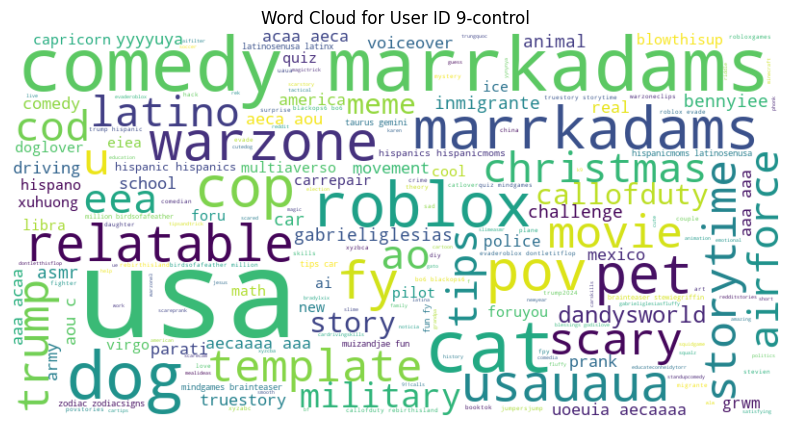

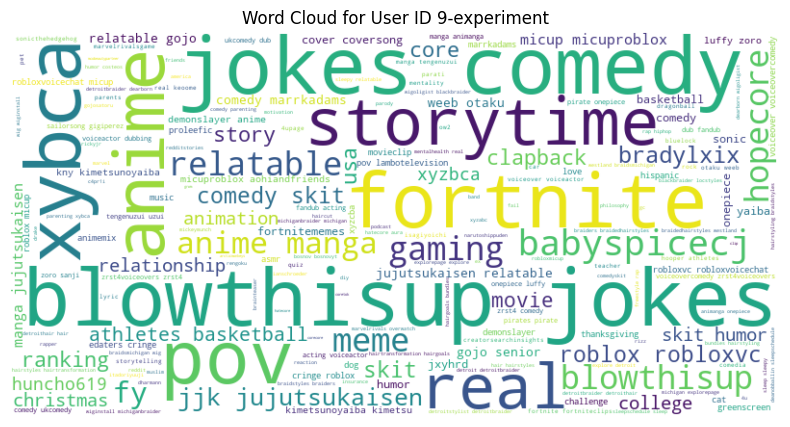

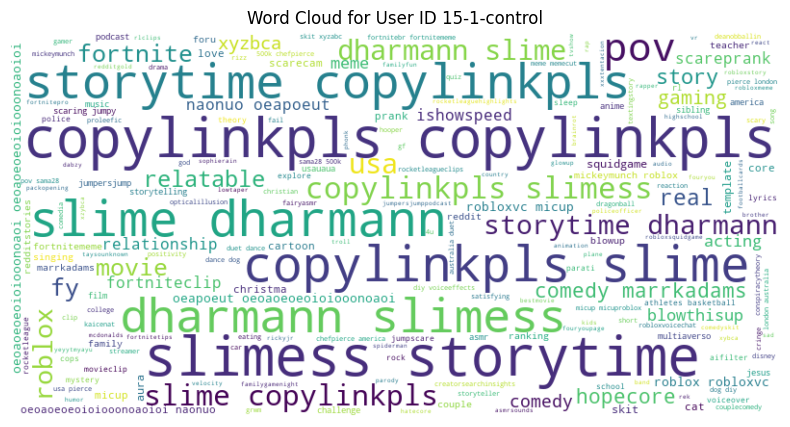

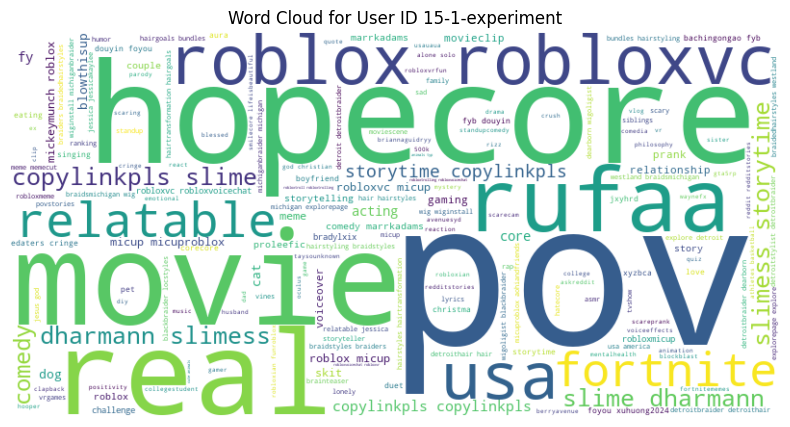

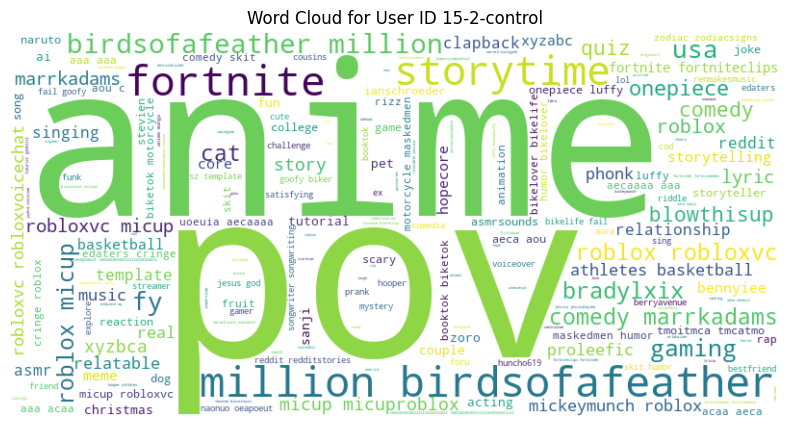

...

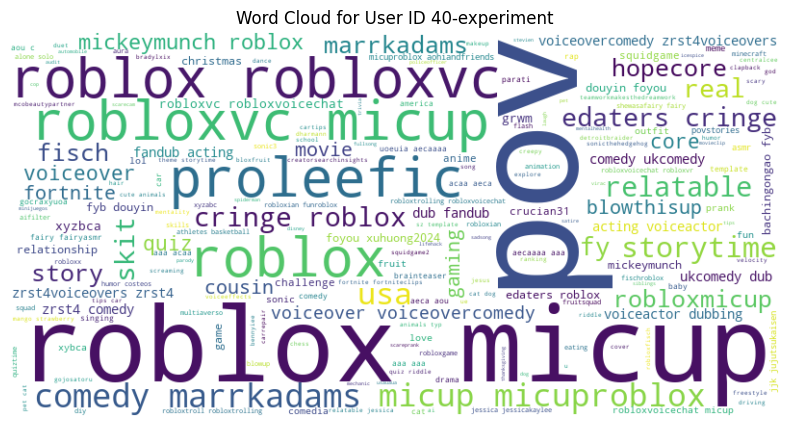

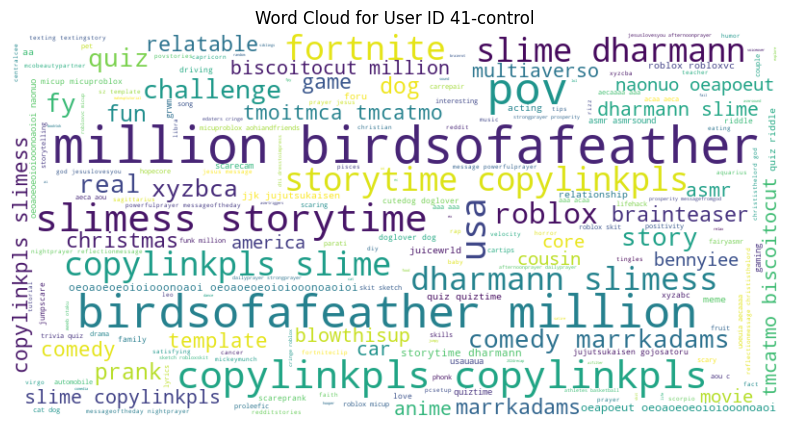

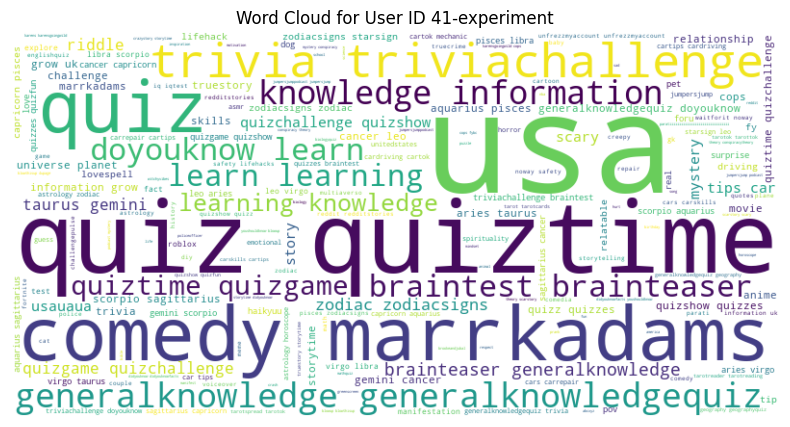

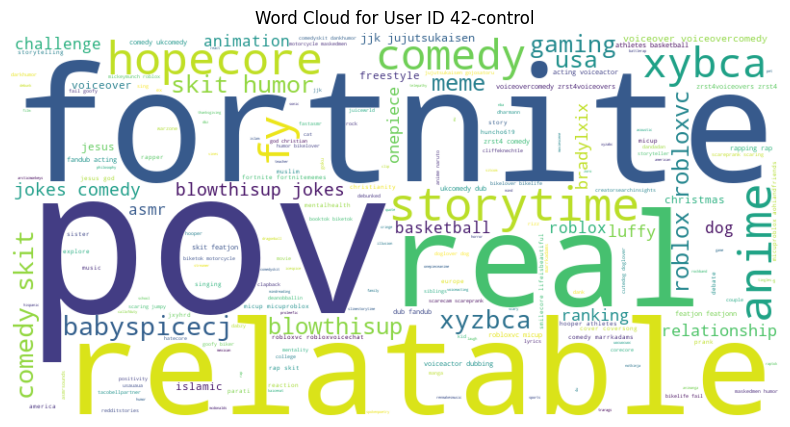

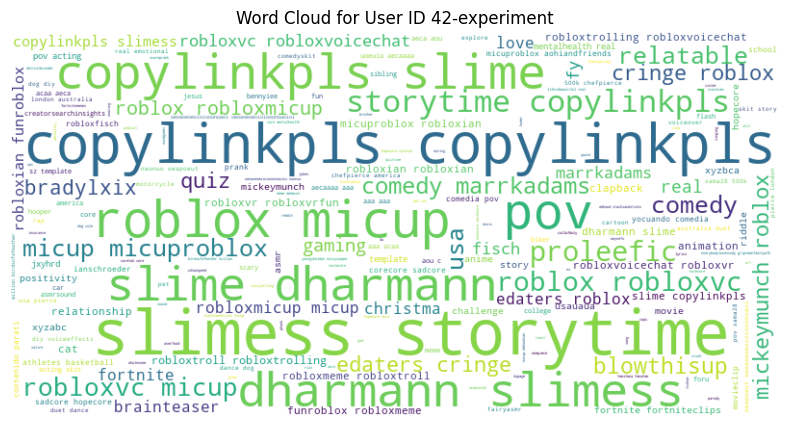

In [38]:
def generate_word_clouds(df):
    user_ids = df['user_id'].unique()
    
    for user_id in user_ids:
        hashtags_list = df[df['user_id'] == user_id]['hashtags_list']
        user_hashtags = [item for sublist in hashtags_list for item in sublist]
        # filtered_hashtags = [hashtag for hashtag in user_hashtags if not any(ignore in hashtag for ignore in hashtags_to_ignore)]
        hashtags = ' '.join(user_hashtags)
        
        wordcloud = WordCloud(width=800, height=400, background_color='white').generate(hashtags)
        
        plt.figure(figsize=(10, 5))
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.title(f'Word Cloud for User ID {user_id}')
        plt.axis('off')
        plt.show()

# Generate and visualize word clouds for hashtags
generate_word_clouds(data_combined)

In [39]:
check_data = data_combined[data_combined['user_id'] == '18-experiment']
exploded_hashtags = check_data['hashtags_list'].explode()

filtered_hashtags = pd.Series([hashtag for hashtag in exploded_hashtags if hashtag not in hashtags_to_ignore])

assert filtered_hashtags.value_counts().index.tolist().count('roblox') == 1